<h1><span style='font-family: "Trebuchet MS", Helvetica, sans-serif;'>CV - Module Project Part-1 Face Detection</span></h1>

<h4><ul>
    <li>
        <span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;"><strong>DOMAIN: </strong>Entertainment</span>
    </li>
</ul></h4>

<h4><ul>
    <li>
        <article><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CONTEXT:</span></strong></article>
    </li>
</ul>
<article>
    <font face="Trebuchet MS, Helvetica, sans-serif">Company X owns a movie application and repository which caters movie streaming to millions of users on a subscription basis.
Company wants to automate the process of displaying cast and crew information in each scene from a movie such that when a user pauses on the
movie and clicks on cast information button, the app will show details of the actor in the scene. Company has an in-house computer vision
and multimedia experts who need to detect faces from screen shots from the movie scene.</font>
</article> </h4>

<h4><ul>
    <li>
        <article><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;"><strong>DATA DESCRIPTION:</strong></span></article>
    </li>
</ul>
<article><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">• DATA DESCRIPTION: The dataset comprises of images and its mask where there is a human face. <a href="http://shuoyang1213.me/WIDERFACE/">[Source]</a></span></article>
    </h4>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">PROJECT OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Face detection from training images.</span></p>
    </h4>

In [1]:
# imports

# !pip install opencv-python
# !pip install scikit-image

import os
import random
import warnings
from time import time
from math import floor
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import trange, tqdm
from collections import defaultdict
import tensorflow as tf
import cv2
import skimage
from plantcv import plantcv as pcv
from skimage.io import imread, imshow
from skimage.color import rgb2gray, rgb2hsv, gray2rgb
from skimage.filters import sobel, threshold_otsu, gaussian, unsharp_mask
from skimage.feature import canny
from skimage.measure import find_contours
from skimage.morphology import binary_dilation, dilation


warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# reproducibility
seed = 7
random.seed(seed)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the dataset</span></strong></li>
</ul></h4>

In [3]:
data_dir = Path('./data/')
raw_data = np.load(data_dir / 'Part 1- Train data - images.npy', allow_pickle=True)  # Load Object Array
raw_data.shape  # Total dataset of 409 images present

(409, 2)

In [4]:
raw_data[0].shape

(2,)

In [5]:
pprint(raw_data[0][0], compact=True)
raw_data[0][0].shape  # rgb image of 333 x 650

array([[[42, 37, 34],
        [56, 51, 48],
        [71, 66, 63],
        ...,
        [23, 33, 34],
        [26, 36, 37],
        [28, 38, 39]],

       [[40, 35, 32],
        [51, 46, 43],
        [64, 59, 56],
        ...,
        [27, 36, 35],
        [24, 33, 32],
        [26, 35, 34]],

       [[43, 38, 35],
        [51, 46, 43],
        [61, 56, 53],
        ...,
        [28, 30, 27],
        [33, 35, 32],
        [35, 37, 34]],

       ...,

       [[56, 47, 40],
        [57, 48, 41],
        [61, 52, 45],
        ...,
        [67, 48, 42],
        [55, 35, 28],
        [60, 40, 33]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [60, 40, 33],
        [54, 34, 27]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [70, 50, 43],
        [64, 44, 37]]], dtype=uint8)


(333, 650, 3)

In [6]:
# each datapoint in data has image and associated label/mask coordinates
raw_data[0][1]

[{'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.08615384615384615, 'y': 0.3063063063063063},
   {'x': 0.1723076923076923, 'y': 0.45345345345345345}],
  'imageWidth': 650,
  'imageHeight': 333},
 {'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.583076923076923, 'y': 0.2912912912912913},
   {'x': 0.6584615384615384, 'y': 0.46846846846846846}],
  'imageWidth': 650,
  'imageHeight': 333}]

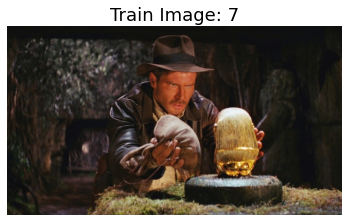

Shape: (450, 800, 3)


In [7]:
def display(img, label, fontsize=18, cmap=None, shape=True):
    '''helper to show images'''
    if cmap is None:
        plt.imshow(img)
    else:
        plt.imshow(img, cmap=cmap)
    plt.title(f'{label}', fontsize=18)
    plt.axis('off')
    plt.show()
    if shape:
        print(f'Shape: {img.shape}')

idx = 7
img = raw_data[idx][0]
display(img, label=f'Train Image: {idx}')

In [8]:
def plot_images(data=raw_data, num=9, img_type='original', fontsize=18,
                func=None, images=None):
    ''' plotting helper: plots random images
        with various optional filters'''

    if images is None:
        # get sample images randomly
        images = list()
        labels = list()
        for idx in random.sample(range(408), 9):
            images.append(data[idx][0])
            labels.append(data[idx][1])

    fig, ax = plt.subplots(3, 3, figsize=(17, 17))
    for n, (ax, img, label) in enumerate(zip(ax.flatten(), images, labels)):
        ax.set_title(f'Shape: {img.shape}', fontsize = fontsize)
        if func is not None:
            img = func(img)
            ax.imshow(img, cmap='gray')
        elif img_type == 'hsv':
            img = rgb2hsv(img) # hsv color space
            ax.imshow(img)
        elif img_type == 'grayscale':
            img = rgb2gray(img) # to grayscale
            ax.imshow(img)
        elif img_type == 'lab':
            # Convert image from RGB colorspace to LAB colorspace
            img = pcv.rgb2gray_lab(img, 'a')
            img = unsharp_mask(img, radius=1, amount=1)
            ax.imshow(img)
        elif img_type == 'sobel':
            img = sobel(img) # sobel filter
            ax.imshow(img)
        elif img_type == 'blur':
            img = pcv.gaussian_blur(img=img, ksize=(7, 7), sigma_x=0, sigma_y=None)
            ax.imshow(img)
        elif img_type == 'sharp':           
            img = pcv.gaussian_blur(img=img, ksize=(3, 3), sigma_x=0, sigma_y=None)
            img = unsharp_mask(img, radius=1, amount=1)
            ax.imshow(img)
        elif img_type == 'edges':
            img = pcv.rgb2gray_lab(img, 'a')
            img = pcv.threshold.binary(img, 120, 255, 'dark') # threshold
            img = pcv.fill(img, 85)  # fill noise, small objects
            img = unsharp_mask(img, radius=1, amount=1)
            # sigma parameter applies the indicated level of guassian smoothing to the image
            edges = canny(img, sigma=0.88) # get edges using canny detector algorithm
            ax.imshow(edges, cmap='gray')
        else:
            ax.imshow(img)
        ax.axis('off')
    fig.tight_layout()

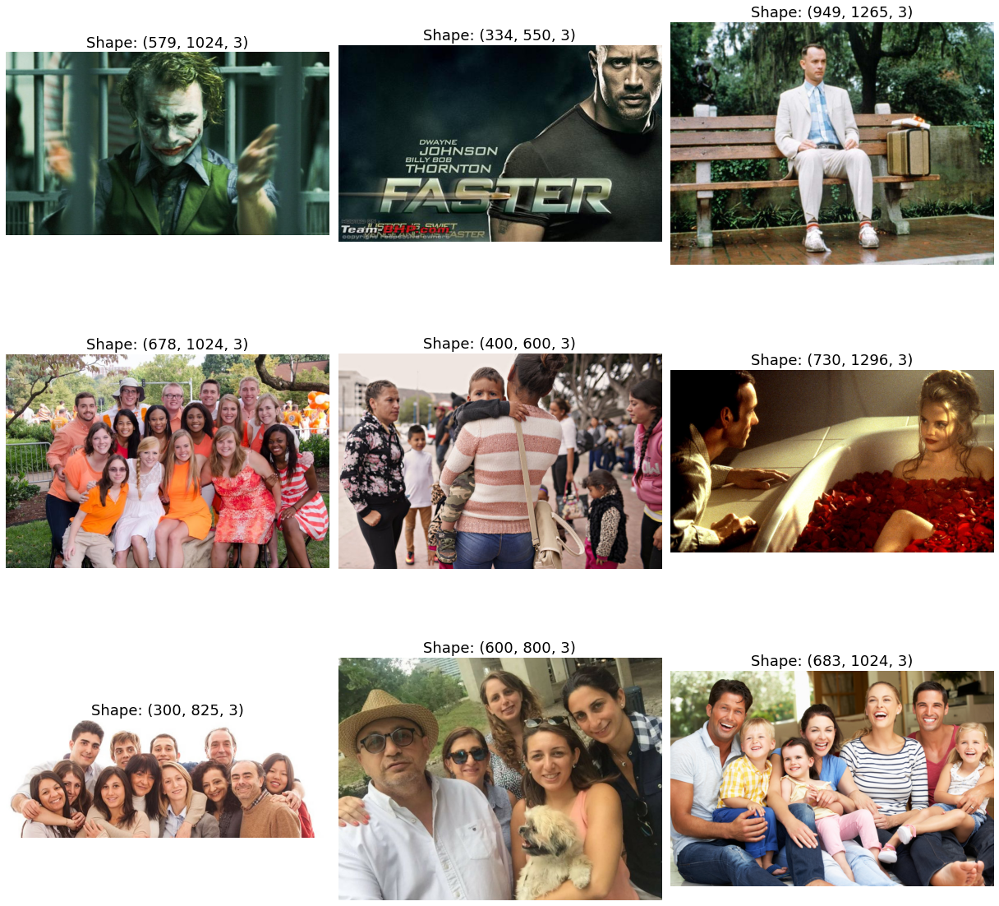

In [9]:
plot_images()

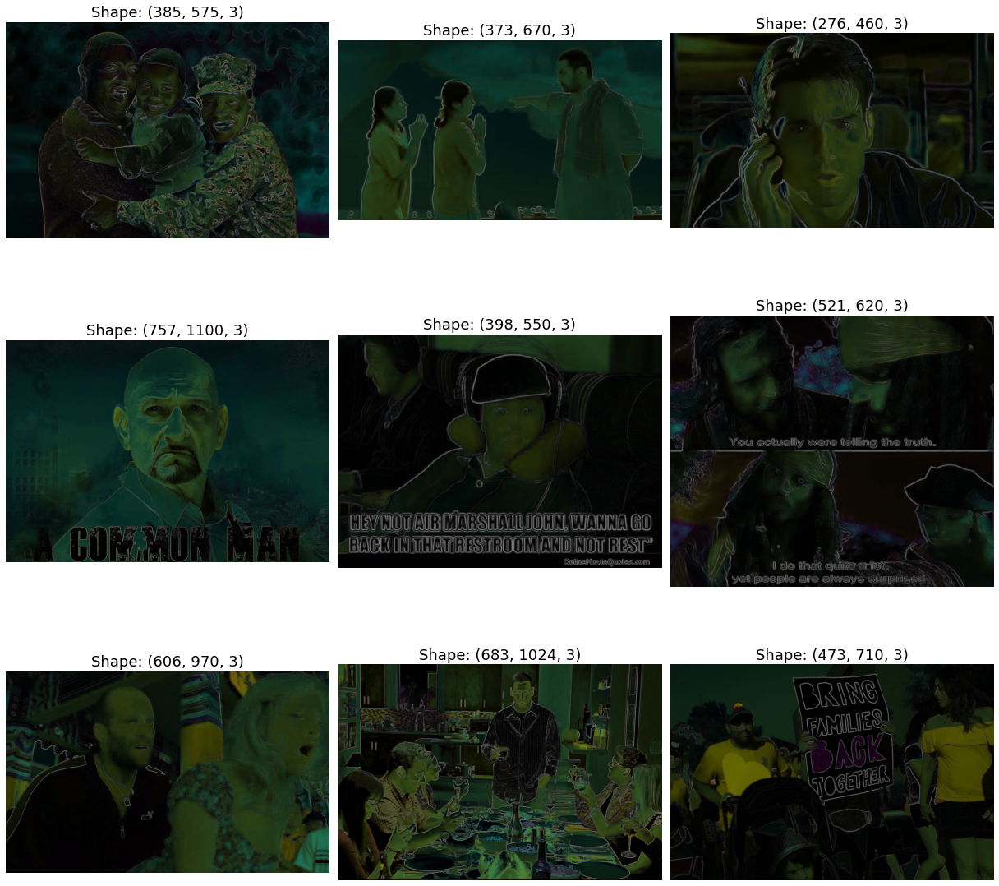

In [10]:
plot_images(img_type='sobel')

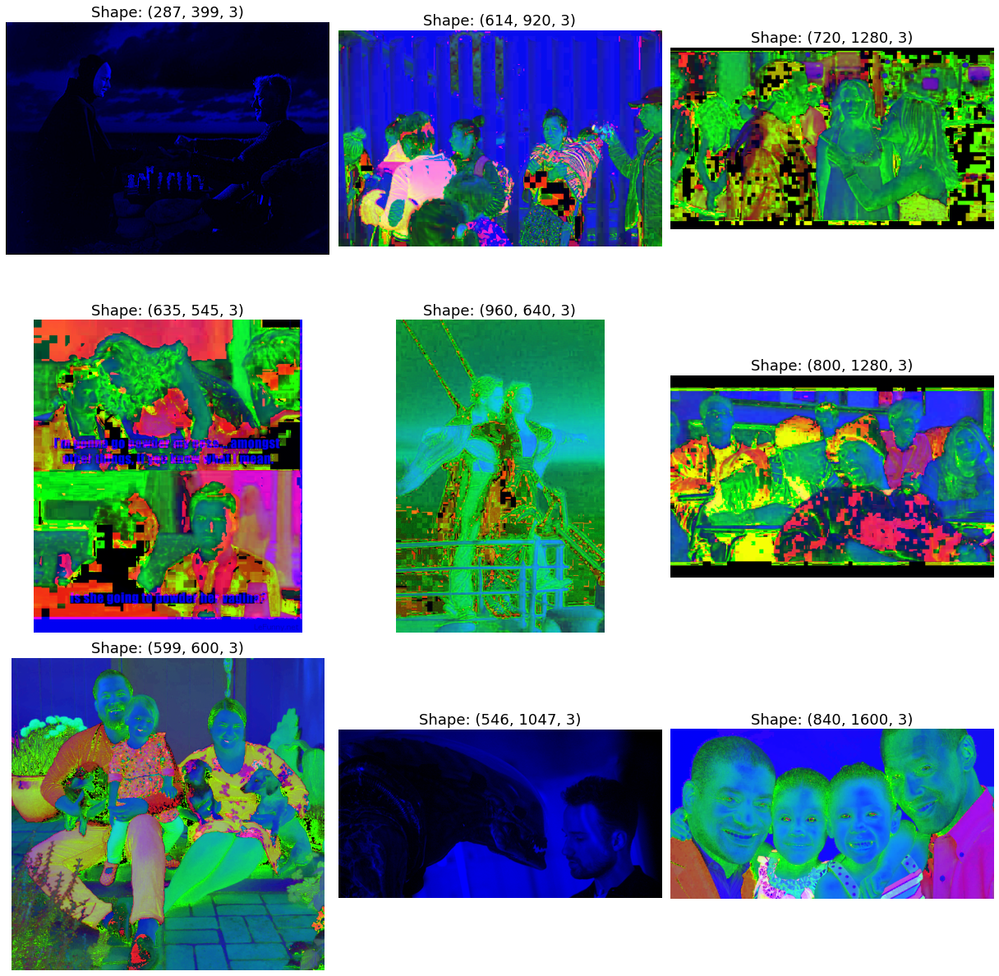

In [11]:
plot_images(img_type='hsv')

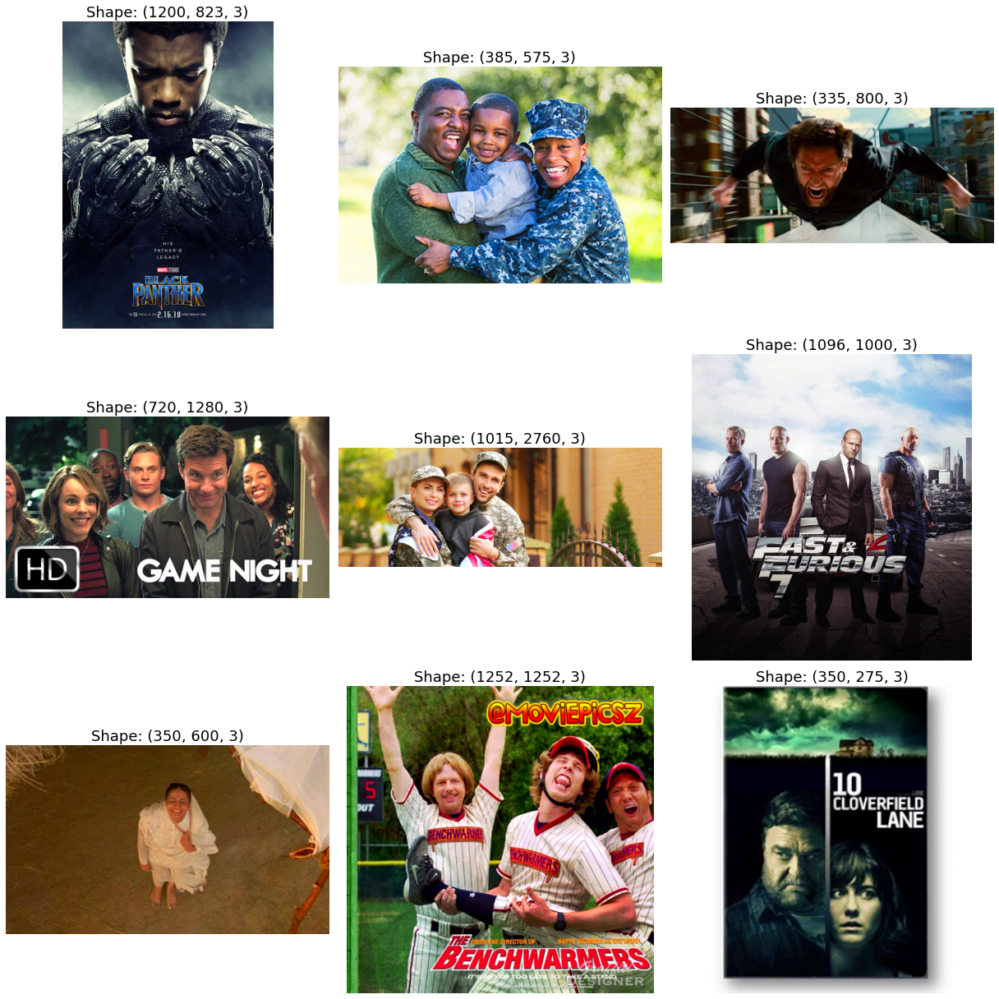

In [12]:
plot_images(img_type='sharp')

<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>We can see that the train dataset is comprised of 409 rgb images/screenshots from various movies; We will have to reshape them to a common size during feature creation to be able to use in Models.
     </span></ul></h5>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Create features (images) and labels (mask) using the data</span></strong></li>
</ul></h4>

In [13]:
# Reqwuired dimensions for mobilenet
ALPHA = 1
IMAGE_SIZE = 224
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 265/409 [00:00<00:00, 1288.49it/s]

too many indices for array: array is 2-dimensional, but 3 were indexed


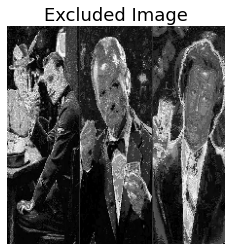

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 409/409 [00:00<00:00, 1103.87it/s]


In [14]:
from tensorflow.keras.applications.mobilenet import preprocess_input

CHANNELS = 3
# create a zero array to be filled with 1s to make the mask using the labels part of each image from dataset
masks = np.zeros((int(raw_data.shape[0]), IMAGE_HEIGHT, IMAGE_WIDTH))
X = np.zeros((int(raw_data.shape[0]), IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))
for index in trange(raw_data.shape[0]):
    img = raw_data[index][0]  # img

    # resize each image to the size IMAGE_HEIGHT x IMAGE_WIDTH (224 x 244) to use with MobileNet
    img = cv2.resize(img, dsize=(IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=cv2.INTER_CUBIC)
    try:
        img = img[:, :, :3]
    except Exception as e:
        # exclude the single image which is not rgb
        print(str(e))
        display(img, label = 'Excluded Image', cmap='gray', shape=False)
        continue
    # apply the preprocessing required for MobileNet on the img that is in correct shape
    X[index] = preprocess_input(np.array(img, dtype=np.float32))
    # get the mask coordinates and fill the portion of array in between the coords as 1
    for i in raw_data[index][1]:
        x1 = int(i['points'][0]['x'] * IMAGE_WIDTH)
        x2 = int(i['points'][1]['x'] * IMAGE_WIDTH)
        y1 = int(i['points'][0]['y'] * IMAGE_HEIGHT)
        y2 = int(i['points'][1]['y'] * IMAGE_HEIGHT)
        masks[index][y1:y2, x1:x2] = 1

In [15]:
X.shape

(409, 224, 224, 3)

In [16]:
masks.shape

(409, 224, 224)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


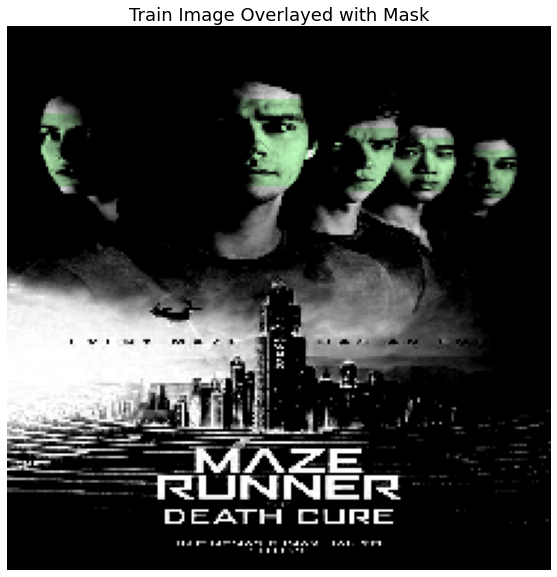

In [17]:
from PIL import Image

def display_mask(img, mask, label, fontsize=18, alpha=0.25, binarize_mask=False):
    '''helper to show images'''
    if binarize_mask:
        thresh = threshold_otsu(mask)
        mask = mask > thresh
    rows, cols = img.shape[0], img.shape[1]
    color_mask = np.zeros((rows, cols, 3))
    color_mask[:, :, 1] = mask
    img_hsv = skimage.color.rgb2hsv(img)
    color_mask_hsv = skimage.color.rgb2hsv(color_mask)
    # Replace the hue and saturation of the original image
    # with that of the color mask
    img_hsv[..., 0] = color_mask_hsv[..., 0]
    img_hsv[..., 1] = color_mask_hsv[..., 1] * alpha
    img_masked = skimage.color.hsv2rgb(img_hsv)
    
    plt.figure(figsize=(10, 10))
    plt.title(f'{label}', fontsize=18)
    plt.axis('off')
    plt.imshow(img_masked)
    plt.show()
    

idx = 11
img = X[idx]
mask = masks[idx]
display_mask(img, mask, label=f'Train Image Overlayed with Mask')

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Split the dataset into Train-Test Cuts
     </span></ul></h4>

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, masks, test_size=0.02, random_state=seed, shuffle=False)
X_train.shape, X_test.shape

((400, 224, 224, 3), (9, 224, 224, 3))

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Mask detection model</span></strong></li>
</ul></h3>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Design a face mask detection model:
 Using U-net along with pre-trained transfer learning models
</span></ul></h4>

In [19]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input,
                                     Conv2D,
                                     UpSampling2D,
                                     Activation,
                                     Concatenate,
                                     Reshape,
                                     BatchNormalization,
                                     SpatialDropout2D)
from tensorflow.keras.applications.mobilenet import MobileNet

In [20]:
# using a predefined architecture with MobileNet Model with imagenet weights loaded
# & adding U-Net Model Layers which are the correspoding upsampling layers to get the "U" Model which works well for image segmentation problems

def conv_block_simple(prev_layer, filters, prefix, strides=(1, 1)):
    '''retrusn a convolutional block using the given filters and strides using keras Functional API'''
    conv = Conv2D(filters, (3, 3), padding='same', kernel_initializer='he_normal', strides=strides, name=prefix + '_conv')(prev_layer)
    batch_norm = BatchNormalization(name = prefix+'BatchNormalization')(conv)
    activations = Activation('relu', name = prefix+'ActivationLayer')(batch_norm)
    return activations

def create_model(trainable=True):
    # using imagenet weights as backend and alpha=1.0
    model = MobileNet(input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3), include_top=False, alpha=1.0, weights="imagenet")

    for layer in model.layers:
        layer.trainable = trainable

    block1 = model.get_layer('conv_pw_13_relu').output
    block2 = model.get_layer('conv_pw_11_relu').output
    block3 = model.get_layer('conv_pw_5_relu').output
    block4 = model.get_layer('conv_pw_3_relu').output
    block5 = model.get_layer('conv_pw_1_relu').output
    
    up1 = Concatenate()([UpSampling2D()(block1), block2])
    conv6 = conv_block_simple(up1, 256, 'Conv_6_1')
    conv6 = conv_block_simple(conv6, 256, 'Conv_6_2')

    up2 = Concatenate()([UpSampling2D()(conv6), block3])
    conv7 = conv_block_simple(up2, 256, 'Conv_7_1')
    conv7 = conv_block_simple(conv7, 256, 'Conv_7_2')

    up3 = Concatenate()([UpSampling2D()(conv7), block4])
    conv8 = conv_block_simple(up3, 192, 'Conv_8_1')
    conv8 = conv_block_simple(conv8, 128, 'Conv_8_2')

    up4 = Concatenate()([UpSampling2D()(conv8), block5])
    conv9 = conv_block_simple(up4, 96, 'Conv_9_1')
    conv9 = conv_block_simple(conv9, 64, 'Conv_9_2')

    up5 = Concatenate()([UpSampling2D()(conv9), model.input])
    conv10 = conv_block_simple(up5, 48, 'Conv_10_1')
    conv10 = conv_block_simple(conv10, 32, 'Conv_10_2')
    conv10 = SpatialDropout2D(0.2)(conv10)
    
    x = Conv2D(1, (1, 1), activation = 'sigmoid')(conv10)
    x = Reshape((IMAGE_SIZE, IMAGE_SIZE))(x)
    return Model(inputs = model.input, outputs = x)

In [21]:
model = create_model()

In [22]:
from keras.utils.layer_utils import count_params
def get_params(model):
    trainable_count = count_params(model.trainable_weights)
    non_trainable_count = count_params(model.non_trainable_weights)
    print('Total params: {:,}'.format(trainable_count + non_trainable_count))
    print('Trainable params: {:,}'.format(trainable_count))
    print('Non-trainable params: {:,}'.format(non_trainable_count))

get_params(model)

Total params: 10,283,745
Trainable params: 10,258,689
Non-trainable params: 25,056


Using TensorFlow backend.


<h5><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Hence, the model has 10,258,689 (~10M) trainable parameters</span></strong></li>
</ul></h5>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Design own Dice Coefficient and Loss function
</span></ul></h4>

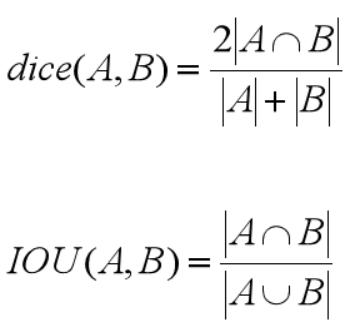

In [23]:
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.backend import log, epsilon

def dice_coefficient(true, pred):
    '''returns value of dice coefficient metric using true values and predicted values'''
    numerator = 2 * tf.reduce_sum(true * pred)
    denominator = tf.reduce_sum(true + pred)
    
    # use a small epsilon in the dominator to avoid ZeroDivisionErrors and nan while training the model
    return numerator / (denominator + epsilon())

def custom_loss(true, pred):
    '''custom loss function using the dice coefficient'''
    # use a small epsilon in the dominator to avoid ZeroDivisionErrors and nan while training the model
    return binary_crossentropy(true, pred) - log(dice_coefficient(true, pred) + epsilon())

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Train, tune and test the model
</span></ul></h4>

In [24]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau

In [25]:
# Define Callbacks and a few helper functions

# To simplify the log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f} | Dice Coefficient: {l['val_dice_coefficient']:.5f} | ", end =" >|> \n" ))

early_stop = EarlyStopping(monitor='val_loss',
                           min_delta=0,
                           patience=10,
                           verbose=1, 
                           restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)


def plot_learning_curve(hist, metric='loss'):
    '''helper function to plot the learning curve'''
    sns.set()
    plt.figure(figsize=(5, 4))
    train = hist.history[metric]
    val = hist.history[f'val_{metric}']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation')
    plt.title(f"{metric.capitalize()} vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [26]:
# compile model
model.compile('Adam', loss=custom_loss, metrics=[dice_coefficient])

In [27]:
epochs = 300
batch_size = 32
with tf.device("gpu:0"):
    h1 = model.fit(X_train, y_train,
                   epochs=epochs,
                   batch_size=batch_size,
                   validation_split=0.14,
                   callbacks = [early_stop, simple_log, lr_reduce_on_plateau],
                   verbose = False)

 ~| Epoch: 1 | Validation Loss: 14.85979 | Dice Coefficient: 0.21708 |  >|> 
 ~| Epoch: 2 | Validation Loss: 14.85978 | Dice Coefficient: 0.21708 |  >|> 
 ~| Epoch: 3 | Validation Loss: 14.85952 | Dice Coefficient: 0.21708 |  >|> 
 ~| Epoch: 4 | Validation Loss: 14.85745 | Dice Coefficient: 0.21708 |  >|> 
 ~| Epoch: 5 | Validation Loss: 14.82395 | Dice Coefficient: 0.21711 |  >|> 
 ~| Epoch: 6 | Validation Loss: 14.52242 | Dice Coefficient: 0.21783 |  >|> 
 ~| Epoch: 7 | Validation Loss: 12.91274 | Dice Coefficient: 0.22335 |  >|> 
 ~| Epoch: 8 | Validation Loss: 11.27742 | Dice Coefficient: 0.23083 |  >|> 
 ~| Epoch: 9 | Validation Loss: 7.55217 | Dice Coefficient: 0.25888 |  >|> 
 ~| Epoch: 10 | Validation Loss: 3.21503 | Dice Coefficient: 0.35395 |  >|> 
 ~| Epoch: 11 | Validation Loss: 2.29382 | Dice Coefficient: 0.40668 |  >|> 
 ~| Epoch: 12 | Validation Loss: 1.76228 | Dice Coefficient: 0.53190 |  >|> 
 ~| Epoch: 13 | Validation Loss: 2.37711 | Dice Coefficient: 0.46654 |  >|> 


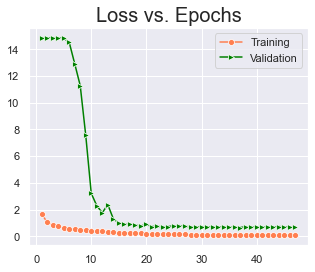

In [28]:
plot_learning_curve(h1, metric='loss')

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Evaluate the model using testing data
</span></ul></h4>

In [29]:
def scores_nn(model):
    loss, dice = model.evaluate(X_train, y_train, verbose=False)
    test_loss, test_dice = model.evaluate(X_test, y_test, verbose=False)
    print(f"Train: Loss: {loss:.3f}, Dice Coefficient: {dice:.3f}")
    print(f"Test:  Loss: {test_loss:.3f}, Dice Coefficient: {test_dice:.3f}")
    
scores_nn(model)

Train: Loss: 0.169, Dice Coefficient: 0.895
Test:  Loss: 0.491, Dice Coefficient: 0.759


<h5><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">We can see that the model has a test (out of sample) loss of 0.614 and Dice Coefficient of 0.757. As we have trained the model on very few images, Some more data collection for these images or using a separate model for these might help boost the final metrics further.</span></strong></li>
</ul></h5>

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Pickle the best model for future use</span></strong></li>
</ul></h3>

In [30]:
best_model = model
filename = 'Face_Detector'
best_model.save(f"{filename}.h5")

In [31]:
# some time later...

# load the model from disk
from tensorflow.keras.models import load_model
 
# load model
face_detector = load_model(f"{filename}.h5", compile=False)
get_params(face_detector)
# compile model
face_detector.compile('Adam', loss=custom_loss, metrics=[dice_coefficient])
# Hence, this model can be loaded and re-used anywhere with similar datasets

Total params: 10,283,745
Trainable params: 10,258,689
Non-trainable params: 25,056


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the “Prediction image” as an input to your designed model and display the output of the image.</span></strong></li>
</ul></h3>

In [32]:
img_path = Path('./data/Part 1 - Test Data - Prediction Image.jpeg')
test_img = imread(img_path)

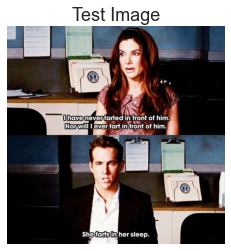

Shape: (500, 500, 3)


In [33]:
display(test_img, label='Test Image')

In [34]:
# predict
def detect_faces(image, model=face_detector):
    plt.figure(figsize=(10, 10))
    display(image, label='Test Image')

    # reshape to IMAGE_HEIGHT x IMAGE_WIDTH
    image_reshaped = cv2.resize(image, dsize=(IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=cv2.INTER_CUBIC)
    plt.figure(figsize=(10, 10))
    display(image_reshaped, label='Reshaped')

    # preprocess
    image_preprocessed = preprocess_input(np.array(image_reshaped, dtype=np.float32))
    plt.figure(figsize=(10, 10))
    display(image_preprocessed, label='Preprocessed')
    
    image_preprocessed
    # reshape the input tensor to expected shape=(1, 224, 224, 3) to make it compatible with mdoel format
    model_input = image_preprocessed.reshape(
        [1, image_preprocessed.shape[0], image_preprocessed.shape[1], image_preprocessed.shape[2]])

    pred_mask = model.predict(model_input, verbose=False)
    pred_mask = np.squeeze(pred_mask)
    # pred_mask = cv2.resize(1.0*(pred_mask > 0.1), (IMAGE_WIDTH, IMAGE_HEIGHT))
    plt.figure(figsize=(10, 10))
    display(pred_mask, label=f'The Mask')
    display_mask(image_preprocessed, pred_mask, label=f'Test Image Overlayed with Mask', binarize_mask=True)

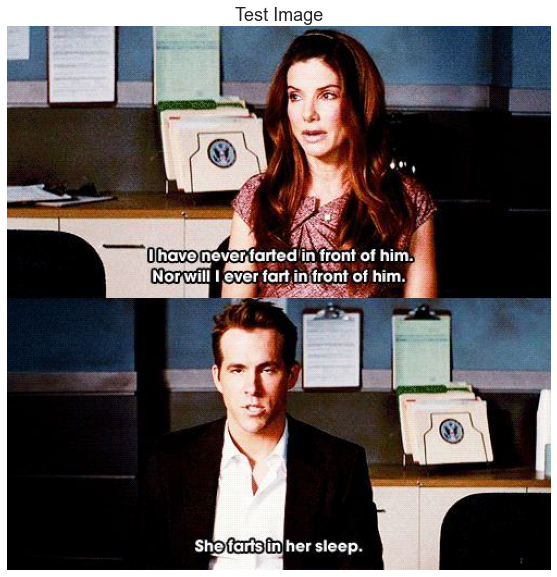

Shape: (500, 500, 3)


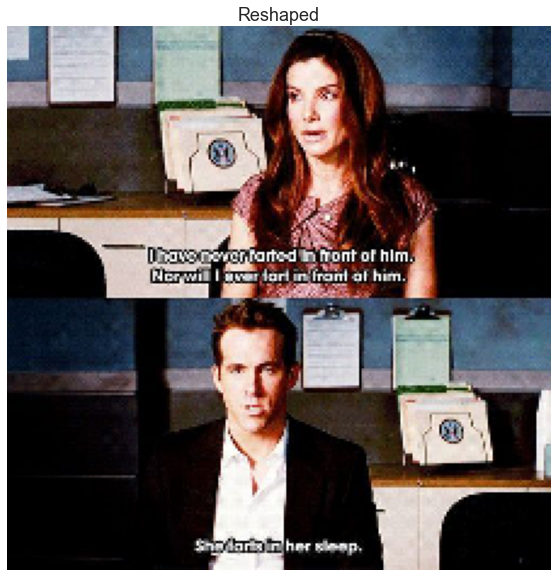

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (224, 224, 3)


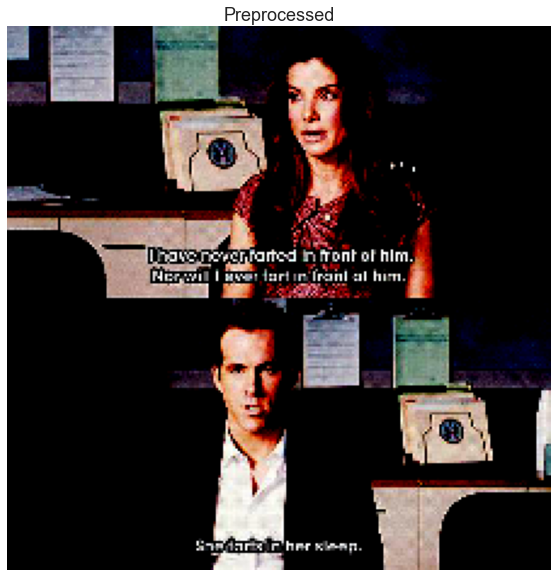

Shape: (224, 224, 3)


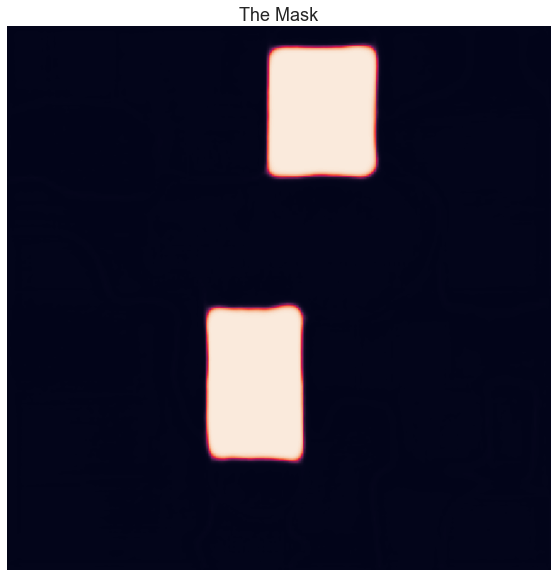

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape: (224, 224)


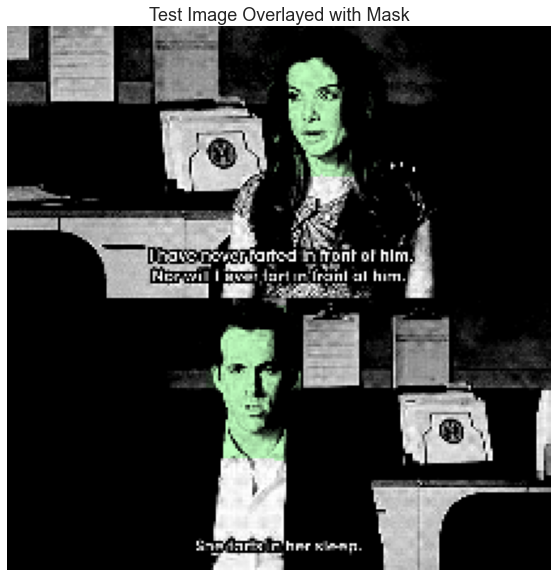

In [35]:
# detect faces in the prediction image
detect_faces(test_img)

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Our Objective was to train a face detection model using Transfer Learning and on top of it use the UNET layers to train, fit and evaluate model which gives the bboxes or the mask around all the faces in an image fed to it. We have obtained a Dice Coefficient of 0.759
</span></ul></h4>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Also, from the learning curve of Loss through epochs, we can clearly see that both losses have converged and the model is not overfitting.
</span></ul></h4>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>As seen in the final test Image, the model does a pretty good job of detecting faces in images. But, could be even better with more training data.
</span></ul></h4>

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Metrics:<br><strong>Train (In-Sample):   Loss: 0.169, Dice Coefficient: 0.895<br>Test (Out-Sample):  Loss: 0.491, Dice Coefficient: 0.759</strong>
</span></ul></h4>